# Hierarchical Clustering by Decade
@author: Thomas Lu, UC Berkeley; Nancy Xu, UC Berkeley<br>
@coauthors: Jaren Haber, PhD, Dartmouth College<br>
@contact: jhaber@berkeley.edu<br>
@project: Computational Literature Review of Organizational Scholarship<br>
@date_created: March 27, 2022
@date_modified: May 17, 2022

@description: '''Conducts hierarchical clustering (agglomerative and spectral) on the word vectors from pretrained word2vec models. Includes clusters seeded on expert-coded lexicons and clustering on only those seed terms. Visualize TSNE plots and dendrograms of the clusters.'''

In [1]:
# !pip install gensim
# !pip install --upgrade scikit-learn

In [23]:
# IMPORTING KEY PACKAGES
import gensim # for word embedding models
import _pickle as cPickle # Optimized version of pickle
from collections import Counter # For counting terms across the corpus
import re # For filtering most_similar() output--remove surnames
import csv # For saving csv files
from gensim.models import KeyedVectors
from gensim.test.utils import datapath
import pandas as pd
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

In [24]:
import os
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering, SpectralClustering
from matplotlib import pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE # For visualizing word embeddings
from scipy.spatial import distance # To use cosine distances for tSNE metric
from itertools import combinations

In [25]:
import warnings
warnings.filterwarnings('ignore')

In [13]:
# wem_path1 = 'nancyxu/w2v_embeddings/word2vec_phrased_filtered_enchant_300d_1970_1979_2022_mar29.bin'

# wem_path2 = 'nancyxu/w2v_embeddings/word2vec_phrased_filtered_enchant_300d_1980_1989_2022_apr4.bin'

# wem_path3 = 'nancyxu/w2v_embeddings/word2vec_phrased_filtered_enchant_300d_1990_1999_2022_apr4.bin'

# wem_path4 = 'nancyxu/w2v_embeddings/word2vec_phrased_filtered_enchant_300d_2000_2016_2022_apr4.bin'

wem_path1 = '../nancyxu/w2v_embeddings/word2vec_phrased_filtered_enchant_300d_1970_1979_2022_mar29.bin'

wem_path2 = '../nancyxu/w2v_embeddings/word2vec_phrased_filtered_enchant_300d_1980_1989_2022_apr4.bin'

wem_path3 = '../nancyxu/w2v_embeddings/word2vec_phrased_filtered_enchant_300d_1990_1999_2022_apr4.bin'

wem_path4 = '../nancyxu/w2v_embeddings/word2vec_phrased_filtered_enchant_300d_2000_2016_2022_apr4.bin'

wem_path1 = '../models_storage/w2v_models/word2vec_phrased_filtered_enchant_300d_1970_1979_2022_oct30.bin'
wem_path2 = '../models_storage/w2v_models/word2vec_phrased_filtered_enchant_300d_1980_1989_2022_oct30.bin'
wem_path3 = '../models_storage/w2v_models/word2vec_phrased_filtered_enchant_300d_1990_1999_2022_oct30.bin'
wem_path4 = '../models_storage/w2v_models/word2vec_phrased_filtered_enchant_300d_2000_2016_2022_oct30.bin'

m1 = KeyedVectors.load(wem_path1)
m2 = KeyedVectors.load(wem_path2)
m3 = KeyedVectors.load(wem_path3)
m4 = KeyedVectors.load(wem_path4)
models = [m1, m2, m3, m4]
# models = [m1, m2]

decades = [
    '1970-1979',
    '1980-1989',
    '1990-1999',
    '2000-2015',
]

In [27]:
def plot_dendrogram(model, figsize=(20,10), color_labels=None, yrange=None, title="Dendrogram", save_plot=None, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    fig = plt.figure(figsize=figsize)
    
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count
    children, distances, counts = model.children_, model.distances_, np.array(counts)

    linkage_matrix = np.column_stack(
        [children, distances, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)
    
    ax = plt.gca()
    if yrange:
        ax.set_ylim(yrange)
    
    if color_labels:
        xlbls = ax.get_xmajorticklabels()
        for lbl in xlbls:
            lbl.set_color(color_labels.get(lbl.get_text(), 'black'))
    plt.title(title)
    if save_plot:
        filepath = "dendogram_imgs/" + str(save_plot) + ".png"
#         print(filepath)
#         assert os.path.isfile(filepath)
        plt.savefig(filepath, bbox_inches='tight')
    plt.show()

def get_cluster_words(model, label, labels):
    words = []
    for i, word in enumerate(labels):
        if labels[i] == label:
            words.append(word)
    return words

In [15]:
# cult_core = pd.read_csv(root + 'dictionary_methods/dictionaries/expanded/closest_culture_200.csv', header=None)[0].apply(lambda x: x.replace(' ', '_'))
# dem_core = pd.read_csv(root + 'dictionary_methods/dictionaries/expanded/closest_demographic_200.csv', header=None)[0].apply(lambda x: x.replace(' ', '_'))
# relt_core = pd.read_csv(root + 'dictionary_methods/dictionaries/expanded/closest_relational_200.csv', header=None)[0].apply(lambda x: x.replace(' ', '_'))

# cult_core = pd.read_csv("cultural_core.txt", sep=" ", header=None)[0]


# dem_core = pd.read_csv("demographic_core.txt", sep=" ", header=None)[0]


# relt_core =pd.read_csv("relational_core.txt", sep=" ", header=None)[0]

cult_core = pd.read_csv("../nancyxu/cultural_core.txt", sep="\n", header=None)[0]


dem_core = pd.read_csv("../nancyxu/demographic_core.txt", sep="\n", header=None)[0]


relt_core = pd.read_csv("../nancyxu/relational_core.txt", sep="\n", header=None)[0]



In [16]:
all_core = set(pd.concat((cult_core, dem_core, relt_core)))
all_color_map = {label: 'r' for label in cult_core}
all_color_map.update({label: 'g' for label in dem_core})
all_color_map.update({label: 'b' for label in relt_core})

for label in all_core:
    if label in cult_core.values and label in dem_core.values:
        all_color_map.update({label: 'tab:gray'})
    if label in cult_core.values and label in relt_core.values:
        all_color_map.update({label: 'tab:gray'})
    if label in relt_core.values and label in dem_core.values:
        all_color_map.update({label: 'tab:gray'})

## Agglomerative Clustering 

In [20]:
def cluster_and_visualize(model, 
                          linkage='average', 
                          label_filter=None, 
                          color_map=None, 
                          figsize=(100, 5),
                          yrange=(0, 1),
                          cores=None,
                          title='Filtered Dendrogram',
                          save_plot=None,
                          p=100,
                          n_clusters=4):
    vecs = []
    
    labels = []
    for word in model.wv.index_to_key:
        if label_filter and not label_filter(word):
            continue 
        labels.append(word)
        vecs.append(model.wv.get_vector(word))
        
    vecs = np.array(vecs)
    cos_dis = (1 - cosine_similarity(vecs, vecs))**3
    
    clustering = AgglomerativeClustering(
        n_clusters=n_clusters, affinity='precomputed', linkage=linkage, 
        compute_distances=True).fit(cos_dis)
    
    # clustering = SpectralClustering( n_clusters = 4, affinity = 'precomputed').fit(cos_dis)
    
    plot_dendrogram(clustering, 
                figsize=figsize,
                color_labels=color_map,
                truncate_mode="level", 
                title=title,
                save_plot=save_plot,
                p=p, 
                labels=labels, 
                leaf_rotation=90, show_leaf_counts=True, leaf_font_size=20, yrange=yrange)

In [21]:
def core_term_dendro(model, decade, n_clusters=4, save_plot=None):
    title = f'Dendrogram of Core Terms from {decade} with n={n_cluster}'
    print(title)
    if save_plot:
        save_plot = title
    cluster_and_visualize(model, title=title,
                          label_filter=lambda x: x in all_core, color_map=all_color_map, yrange=(0, 0.8), 
                          figsize=(30, 7), n_clusters=n_clusters, save_plot=save_plot)




Dendrogram of Core Terms from 1970-1979 with n=4


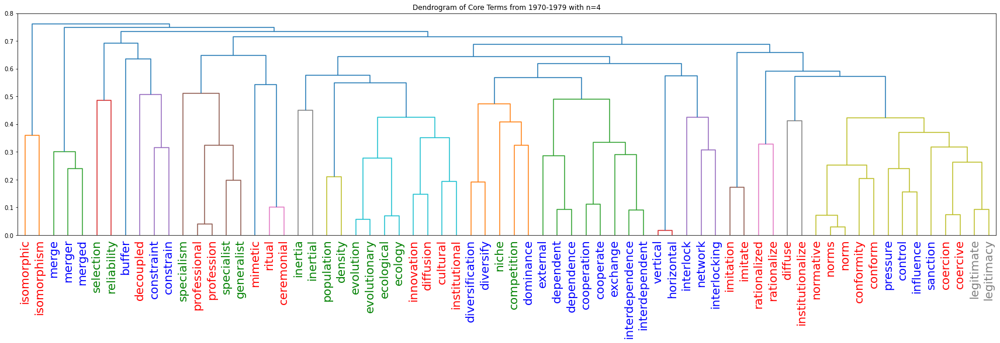

Dendrogram of Core Terms from 1970-1979 with n=6


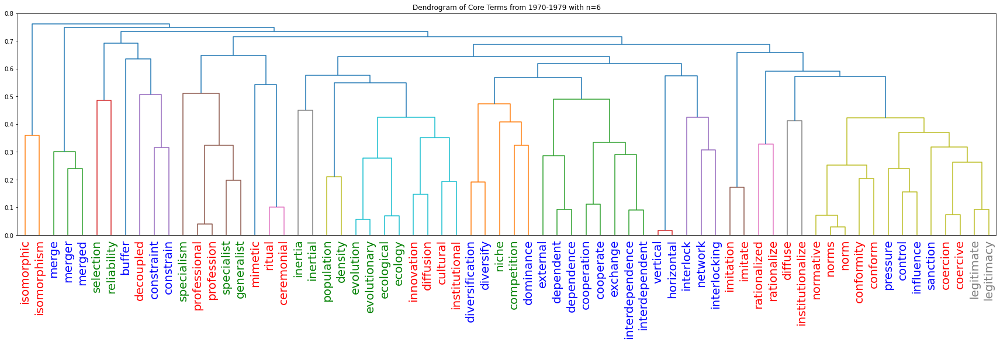

Dendrogram of Core Terms from 1970-1979 with n=8


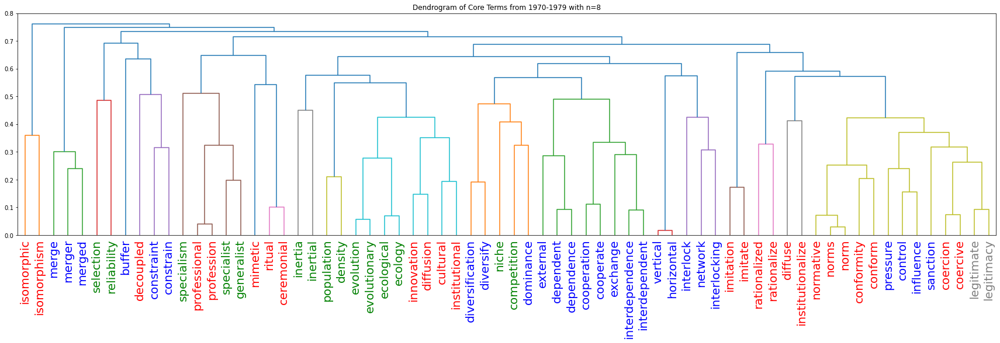

Dendrogram of Core Terms from 1970-1979 with n=10


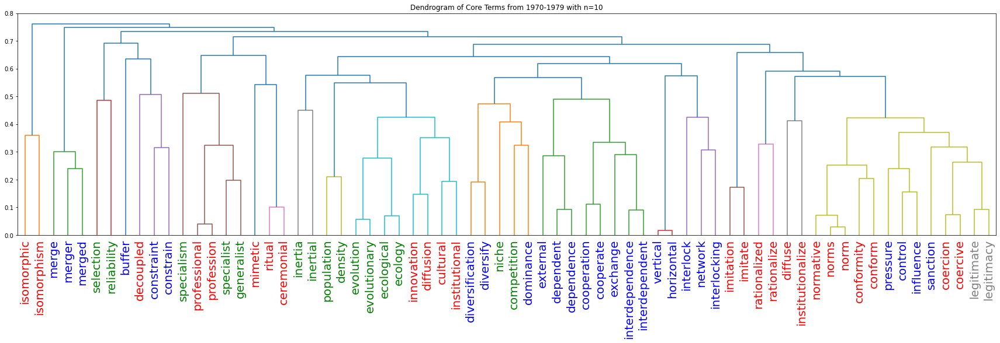




Dendrogram of Core Terms from 1980-1989 with n=4


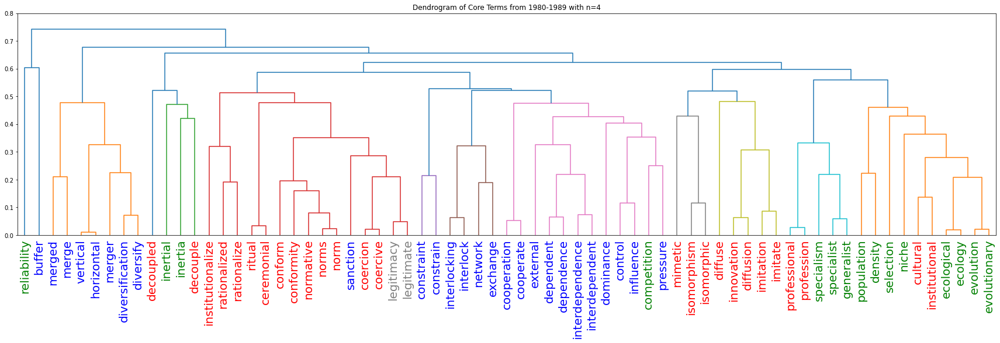

Dendrogram of Core Terms from 1980-1989 with n=6


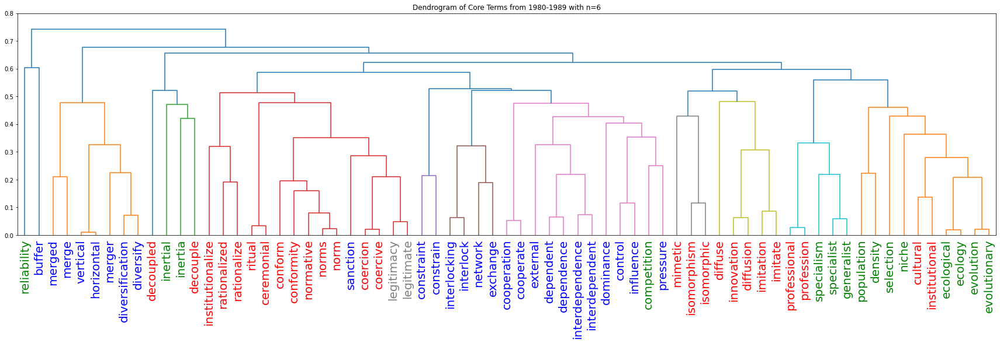

Dendrogram of Core Terms from 1980-1989 with n=8


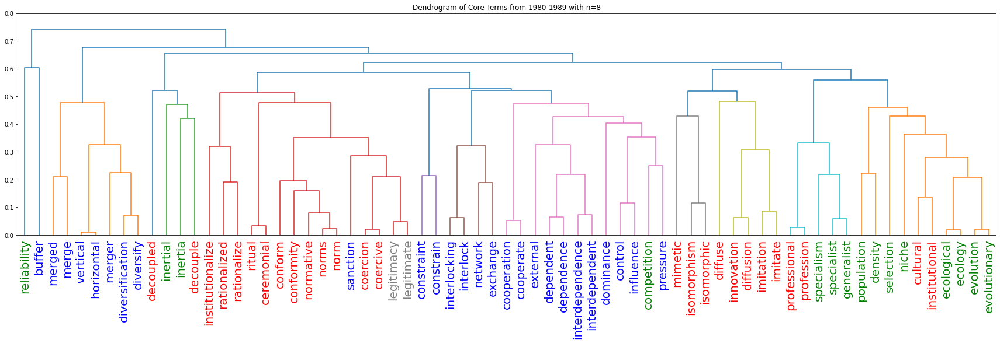

Dendrogram of Core Terms from 1980-1989 with n=10


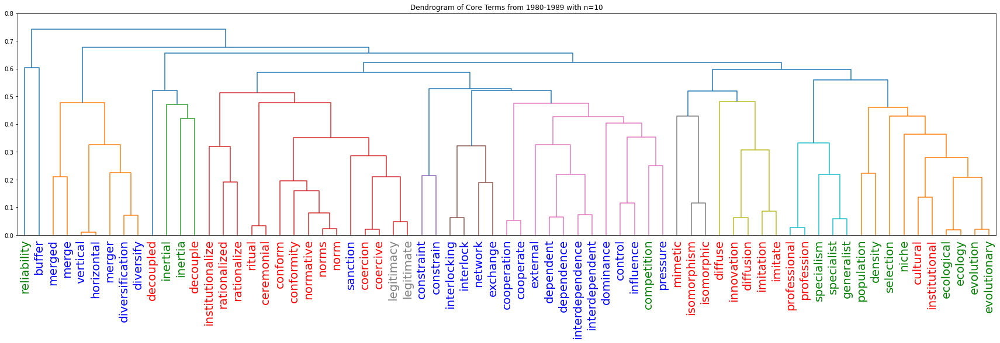




Dendrogram of Core Terms from 1990-1999 with n=4


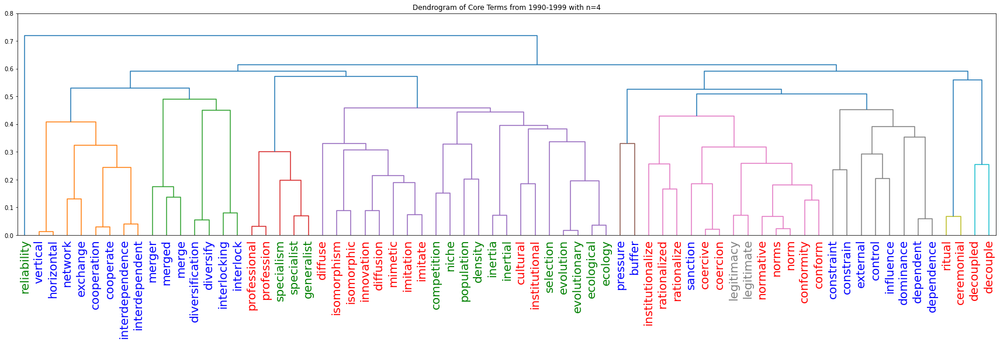

Dendrogram of Core Terms from 1990-1999 with n=6


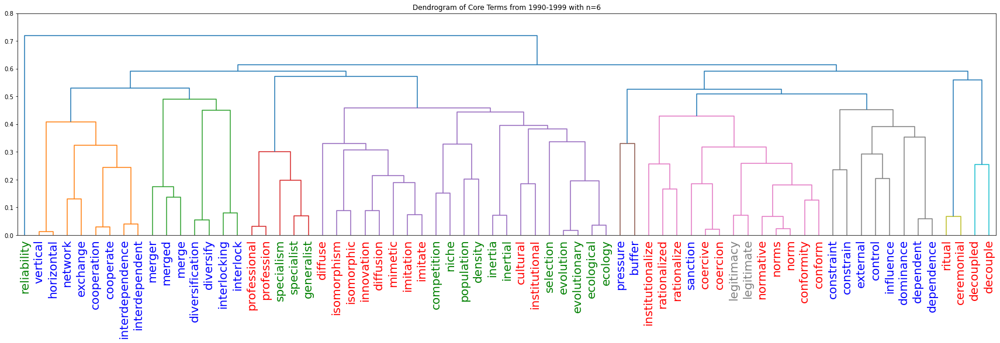

Dendrogram of Core Terms from 1990-1999 with n=8


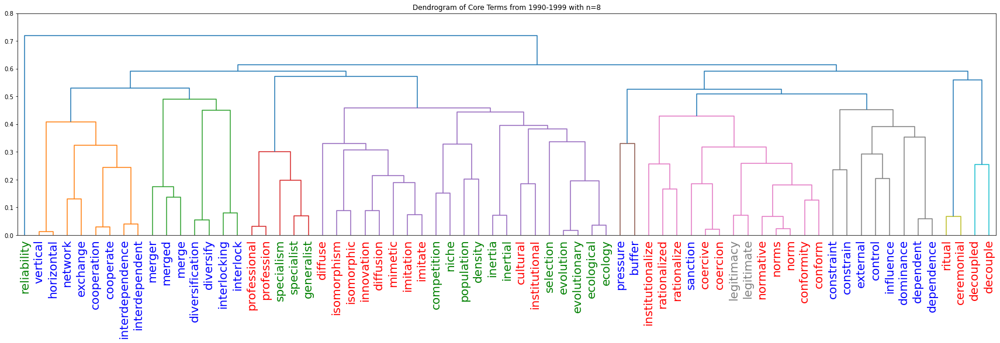

Dendrogram of Core Terms from 1990-1999 with n=10


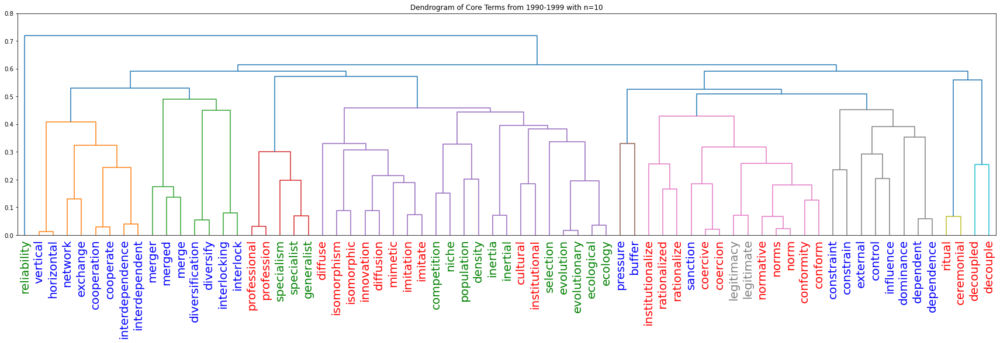




Dendrogram of Core Terms from 2000-2015 with n=4


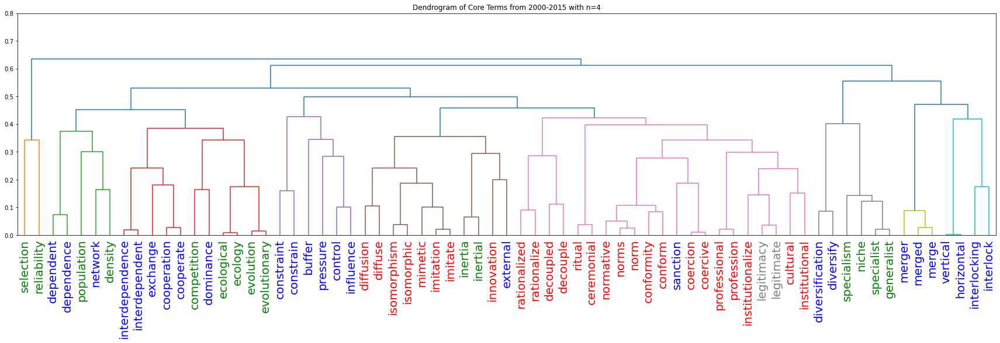

Dendrogram of Core Terms from 2000-2015 with n=6


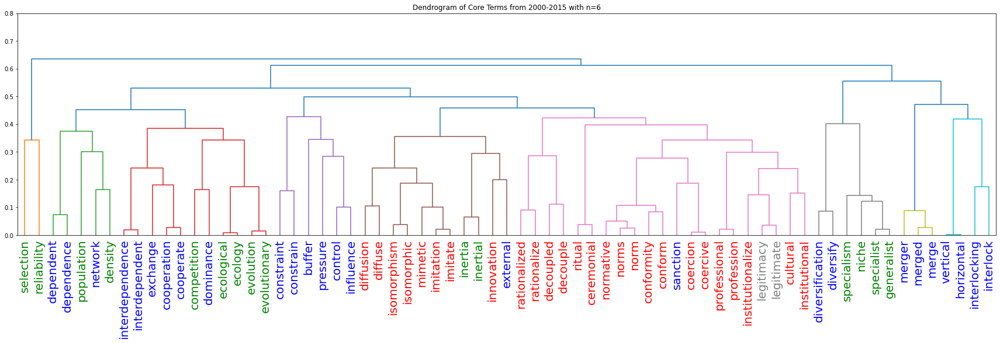

Dendrogram of Core Terms from 2000-2015 with n=8


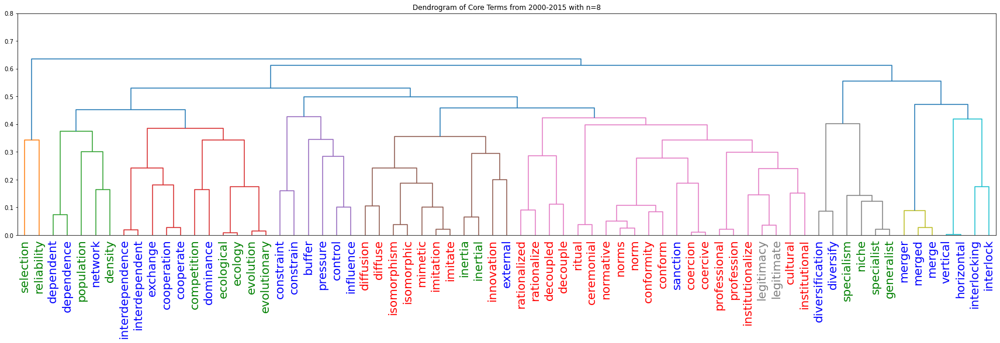

Dendrogram of Core Terms from 2000-2015 with n=10


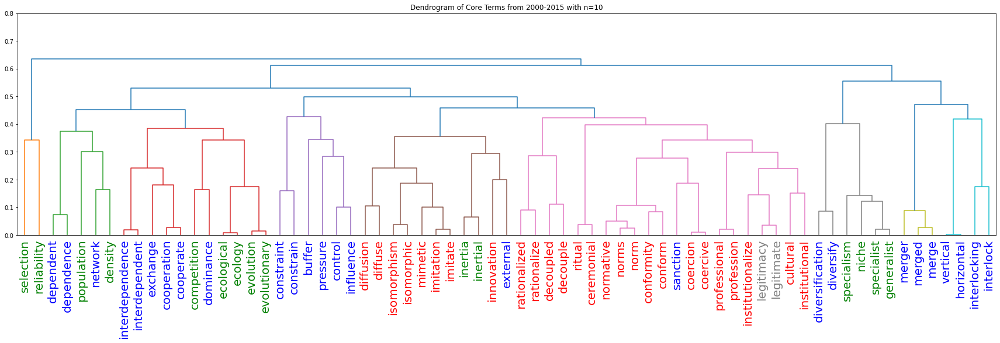

In [28]:
for model, decade in zip(models, decades):
    print('\n\n')
    for n_cluster in [4, 6, 8, 10]:
        core_term_dendro(model, decade, n_cluster, save_plot=True)

In [69]:
# cult_core = pd.read_csv(root + 'dictionary_methods/dictionaries/core/cultural_core.csv', header=None)[0].apply(lambda x: x.replace(' ', '_'))
# dem_core = pd.read_csv(root + 'dictionary_methods/dictionaries/core/demographic_core.csv', header=None)[0].apply(lambda x: x.replace(' ', '_'))
# relt_core = pd.read_csv(root + 'dictionary_methods/dictionaries/core/relational_core.csv', header=None)[0].apply(lambda x: x.replace(' ', '_'))

In [18]:
def collect_ave_distance(d_mat, core, k, comb=np.min):
    
    words = core[:]
    for i in range(k):
        distances = comb(d_mat[words], axis=0).reshape(-1)
        inds = np.argpartition(distances, k+2)
        for idx in inds[:k+2]:
            if idx not in words:
                words.append(idx)
                break
    return words

In [25]:
def seed_clusters(model, 
                  seed_words,
                  k=50,
                  linkage='average', 
                  figsize=(80, 10),
                  title='Seed Clusters',
                  comb=np.min,
                  save=None,
                  p=100):
    
    seed_words = [word for word in seed_words if word in model.wv]
    
    vecs = []
    labels = []
    for word in model.wv.index_to_key:
        labels.append(word)
        vecs.append(model.wv.get_vector(word))
    
    vecs = np.array(vecs)
    cos_dis = (1 - cosine_similarity(vecs, vecs))
    
    for w1, w2 in combinations(seed_words, 2):
        cos_dis[model.wv.key_to_index[w1], model.wv.key_to_index[w2]] = 0.0
    
    idx = collect_ave_distance(cos_dis, [model.wv.key_to_index[w] for w in seed_words], k, comb=comb)
    
    cluster_words = np.array(labels)[idx]
    if save:
        save_words = pd.DataFrame(cluster_words)
        save_words.to_csv(save, index=False)
    
    ctitle = title + ' Similar Words Dendrogram'
    print(ctitle)
    cluster_and_visualize(model, label_filter=lambda x: x in cluster_words, 
                          p=p, figsize=figsize, linkage=linkage, title=ctitle,
                          color_map=all_color_map, yrange=(0, 0.8))
    
    ctitle = title + ' Similar Words T-SNE'
    print()
    show_tsne(model.wv, cluster_words, title=ctitle, color_map=all_color_map)

In [26]:
def show_tsne(model, words, title='T-SNE', core_words=(), color_map={}):
    
    arr = []
    word_labels = []

    # add the vector for each of the closest words to the array
    for wrd_label in words:
        if wrd_label not in model:
            continue
        arr.append( model[wrd_label] )
        word_labels.append(wrd_label)
    arr = np.array(arr)

    # find tsne coords for 2 dimensions, using cosine distances as metric
    tsne = TSNE(n_components=2, random_state=0, metric=distance.cosine)
    np.set_printoptions(suppress=True)
    Y = tsne.fit_transform(arr)

    x_coords = Y[:, 0]
    y_coords = Y[:, 1]

    # display scatter plot
    fig, ax = plt.subplots(figsize=(20,20))
    ax.scatter(x_coords, y_coords, alpha=1, s=100,
               c=[color_map.get(word, 'black') for word in word_labels])

    sns.set(style='white')

    for label, x, y in zip(word_labels, x_coords, y_coords):
        if label in core_words:
            ax.annotate(label, xy=(x, y), xytext=(0, 0), textcoords='offset points', fontweight='bold').set_fontsize(20)
        else:
            ax.annotate(label, xy=(x, y), xytext=(0, 0), textcoords='offset points').set_fontsize(20)

    print(title)
    plt.title(title)
    ax.set_xlim(x_coords.min()+1, x_coords.max()+1)
    ax.set_ylim(y_coords.min()-1, y_coords.max()+1)
    ax.set_xlabel('t-SNE dimension 1')
    ax.set_ylabel('t-SNE dimension 2')
    ax.xaxis.label.set_fontsize(24)
    ax.yaxis.label.set_fontsize(24)
    xlbls = ax.get_xmajorticklabels()
    for item in (ax.get_xticklabels() + ax.get_yticklabels()):
        item.set_fontsize(16)
    plt.show()

Cultural Terms in 1970-1979 Similar Words Dendrogram


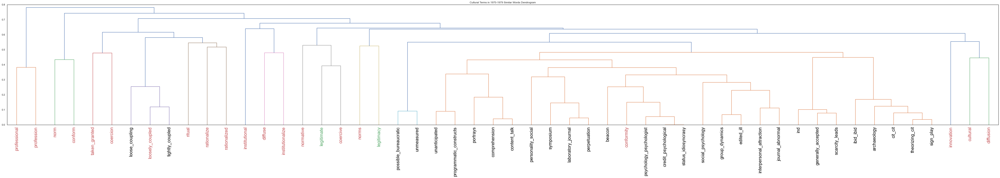


Cultural Terms in 1970-1979 Similar Words T-SNE


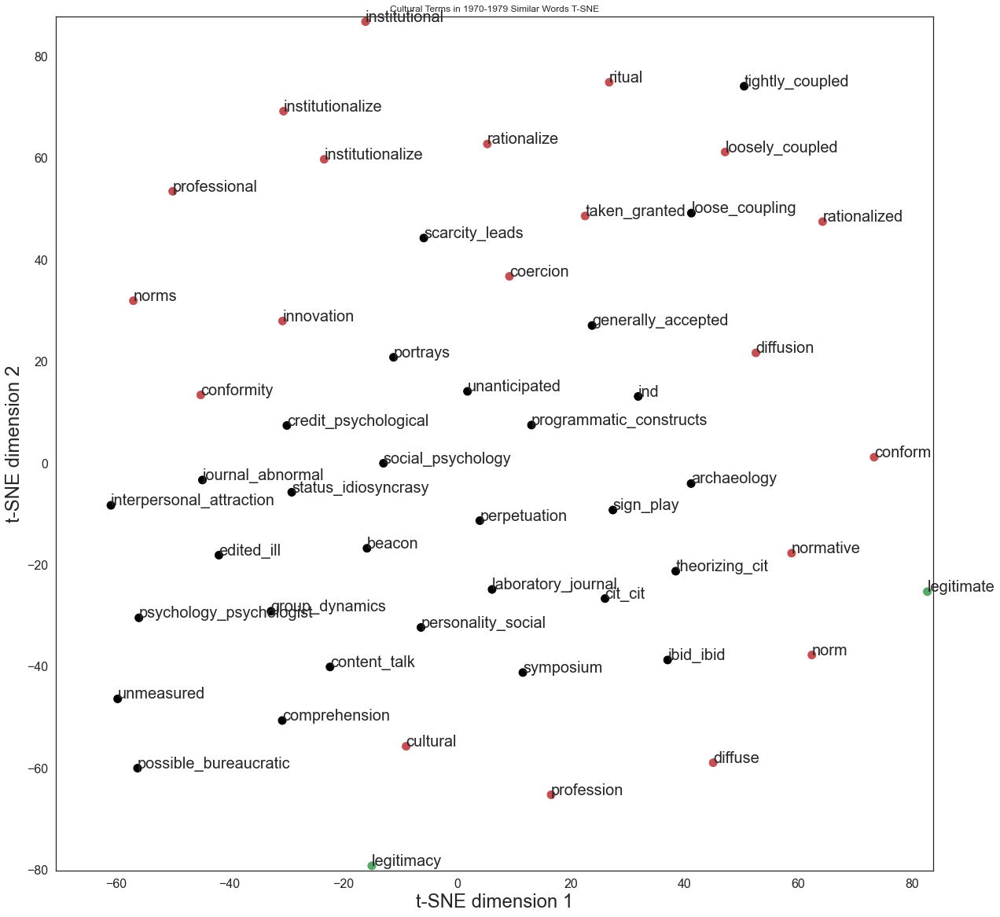

Demographic Terms in 1970-1979 Similar Words Dendrogram


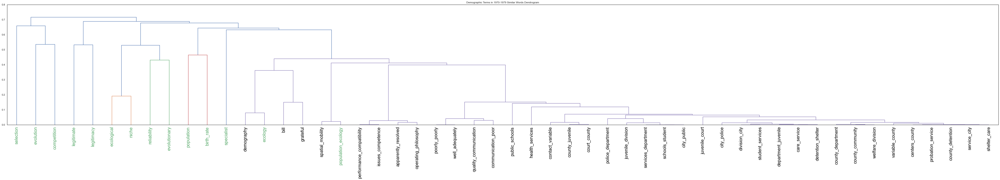


Demographic Terms in 1970-1979 Similar Words T-SNE


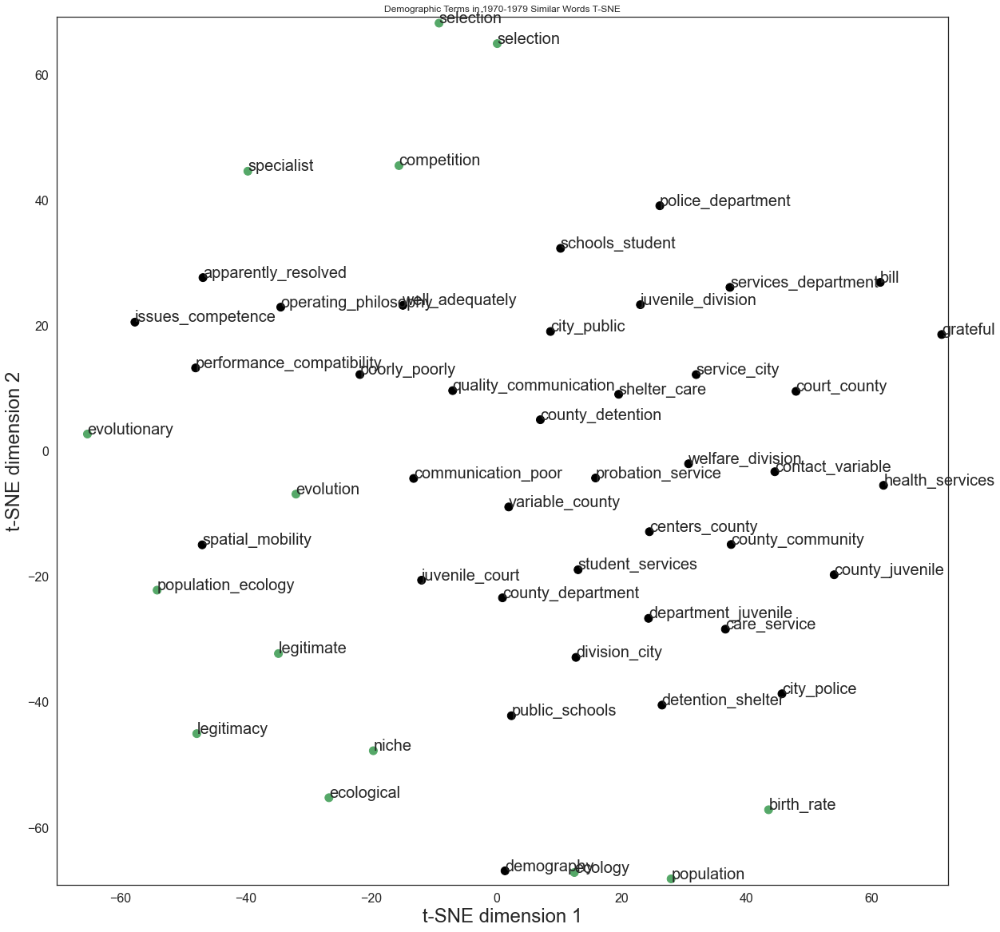

Relational Terms in 1970-1979 Similar Words Dendrogram


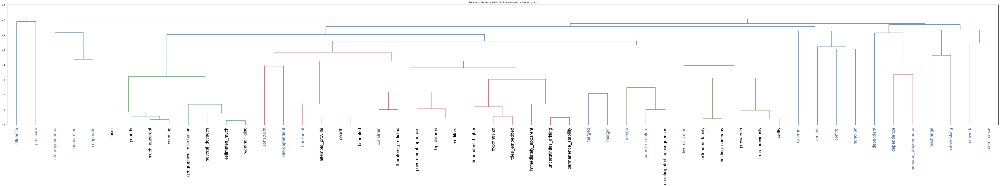


Relational Terms in 1970-1979 Similar Words T-SNE


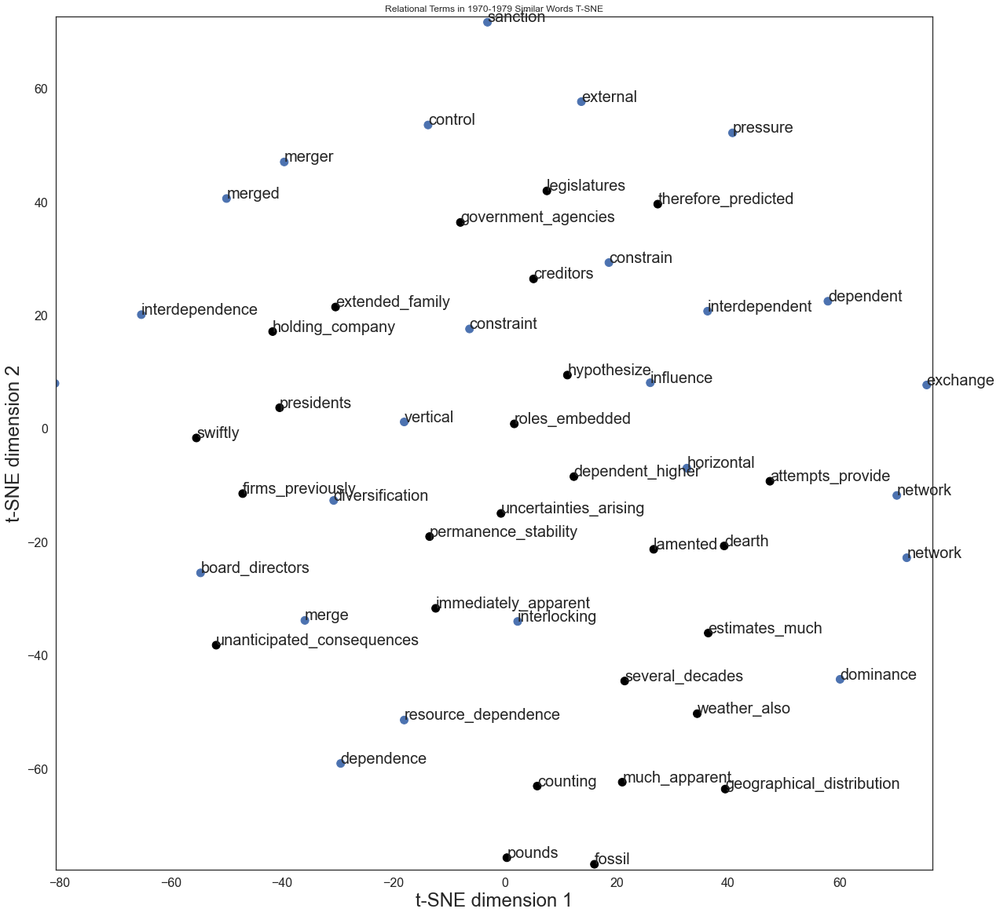

Cultural Terms in 1980-1989 Similar Words Dendrogram


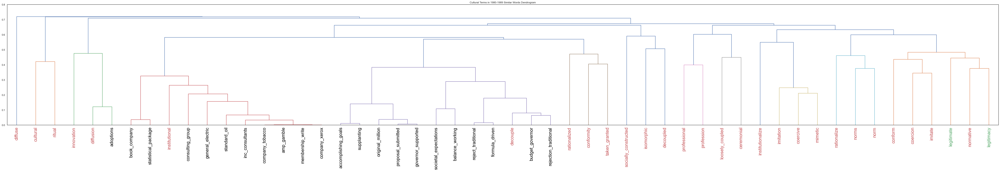


Cultural Terms in 1980-1989 Similar Words T-SNE


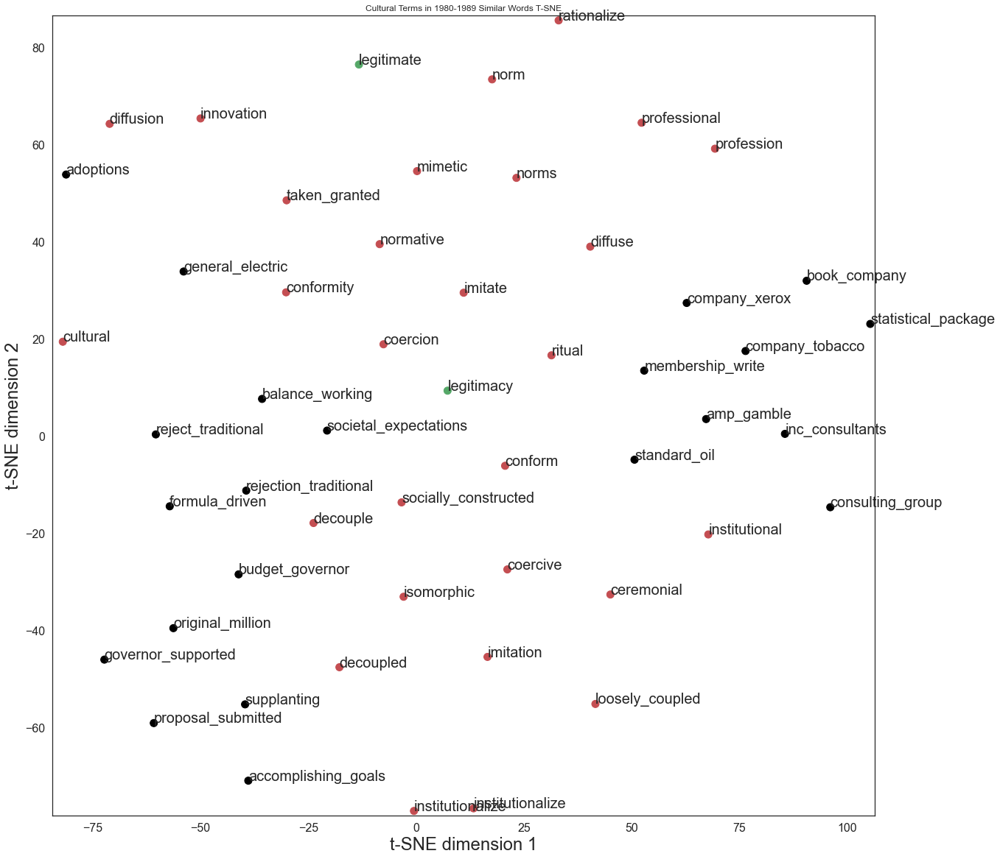

Demographic Terms in 1980-1989 Similar Words Dendrogram


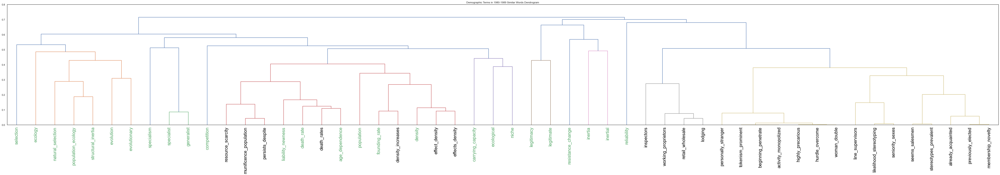


Demographic Terms in 1980-1989 Similar Words T-SNE


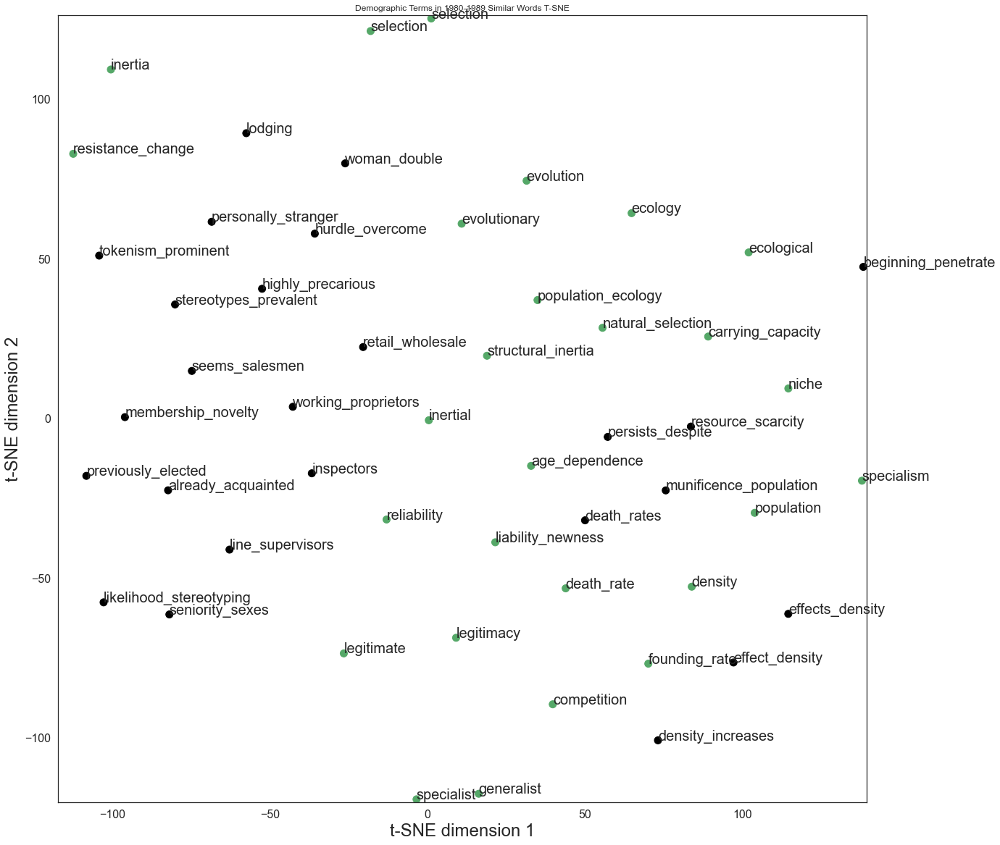

Relational Terms in 1980-1989 Similar Words Dendrogram


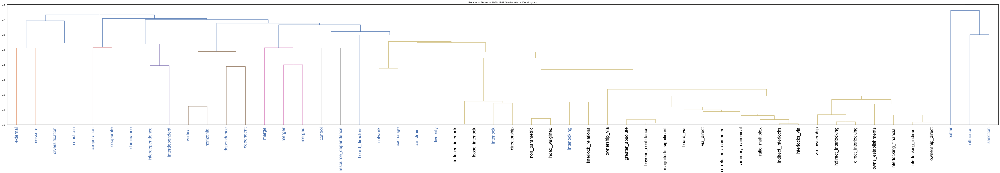


Relational Terms in 1980-1989 Similar Words T-SNE


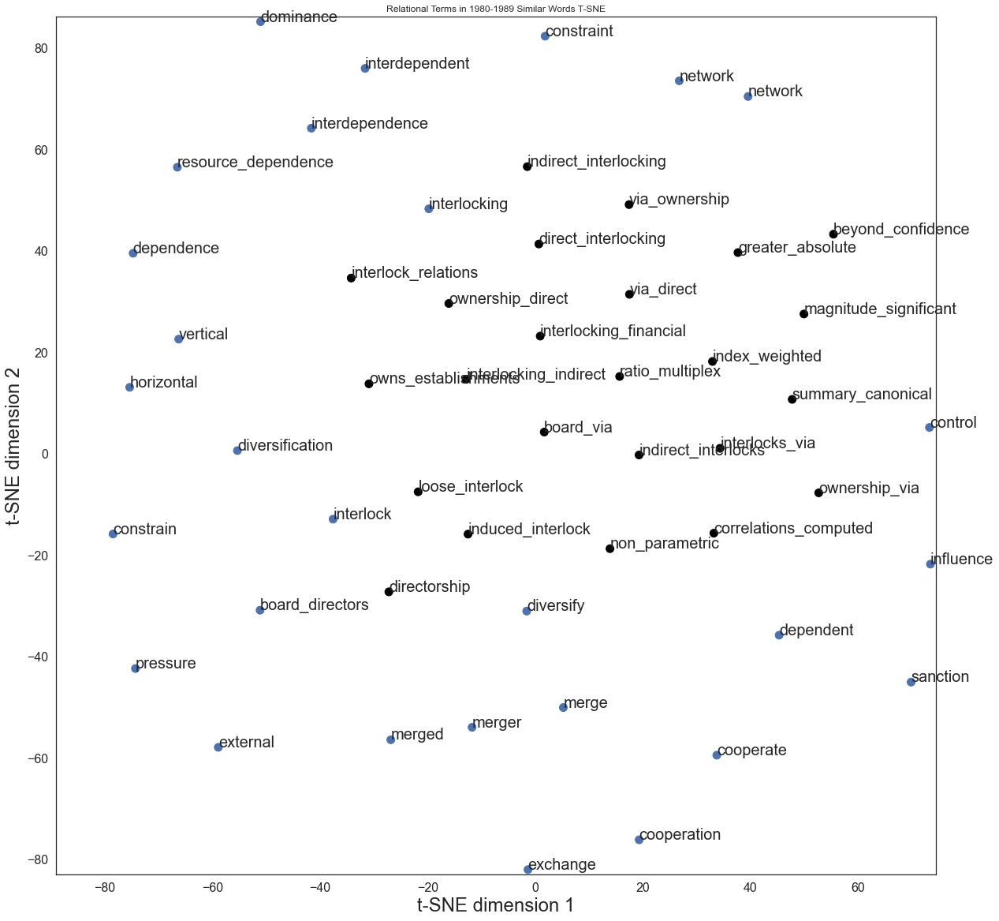

Cultural Terms in 1990-1999 Similar Words Dendrogram


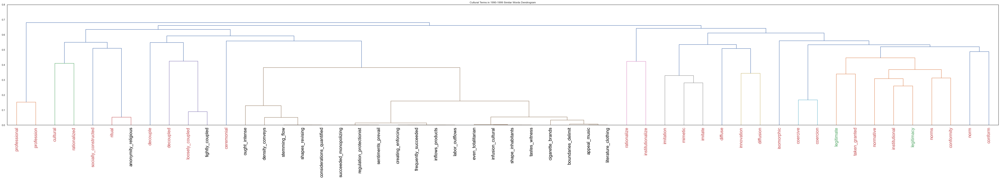


Cultural Terms in 1990-1999 Similar Words T-SNE


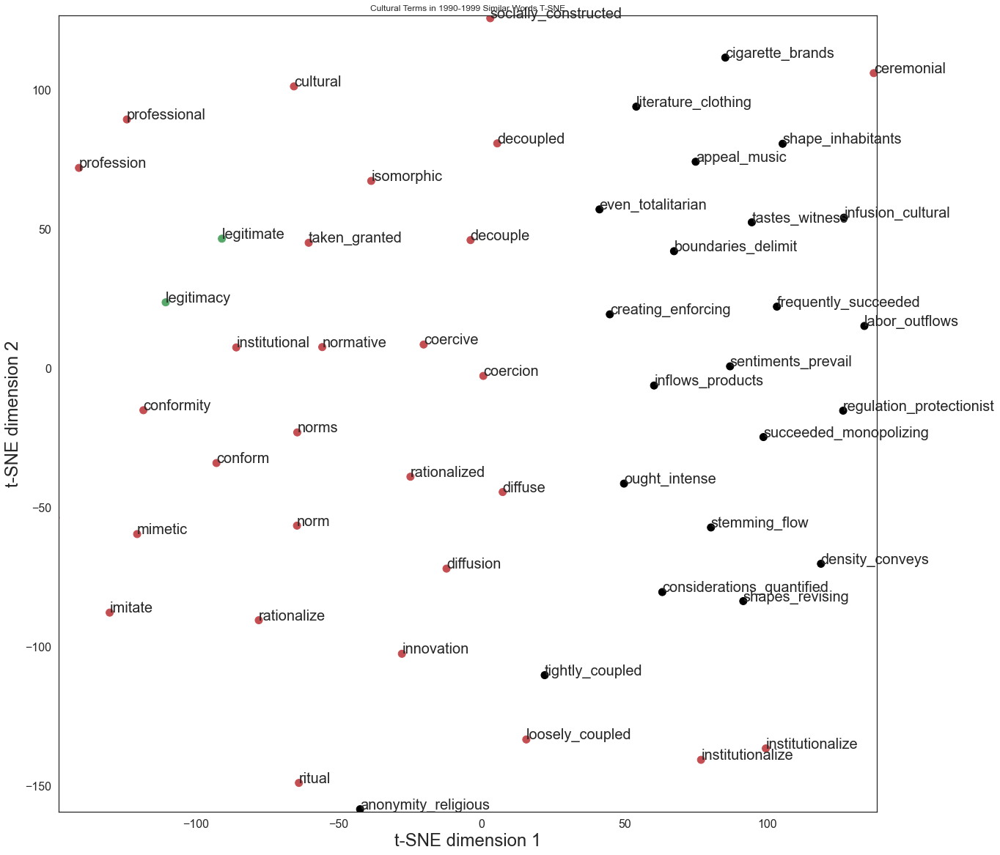

Demographic Terms in 1990-1999 Similar Words Dendrogram


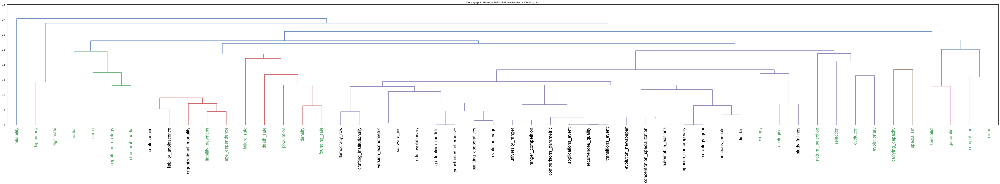


Demographic Terms in 1990-1999 Similar Words T-SNE


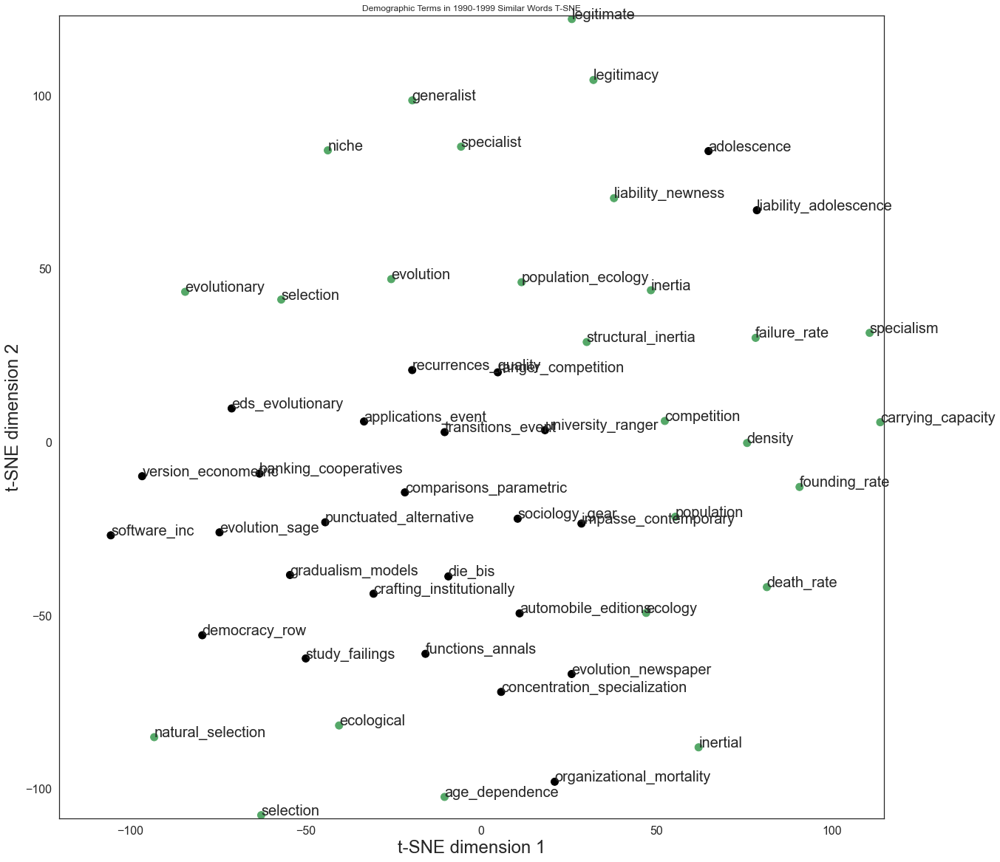

Relational Terms in 1990-1999 Similar Words Dendrogram


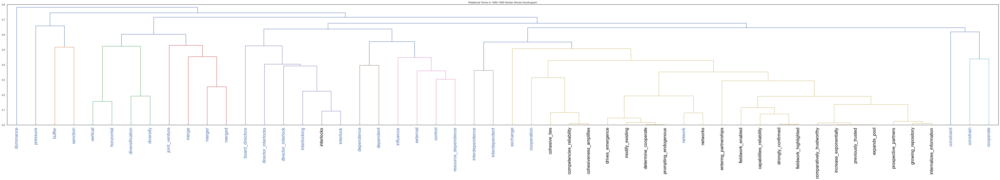


Relational Terms in 1990-1999 Similar Words T-SNE


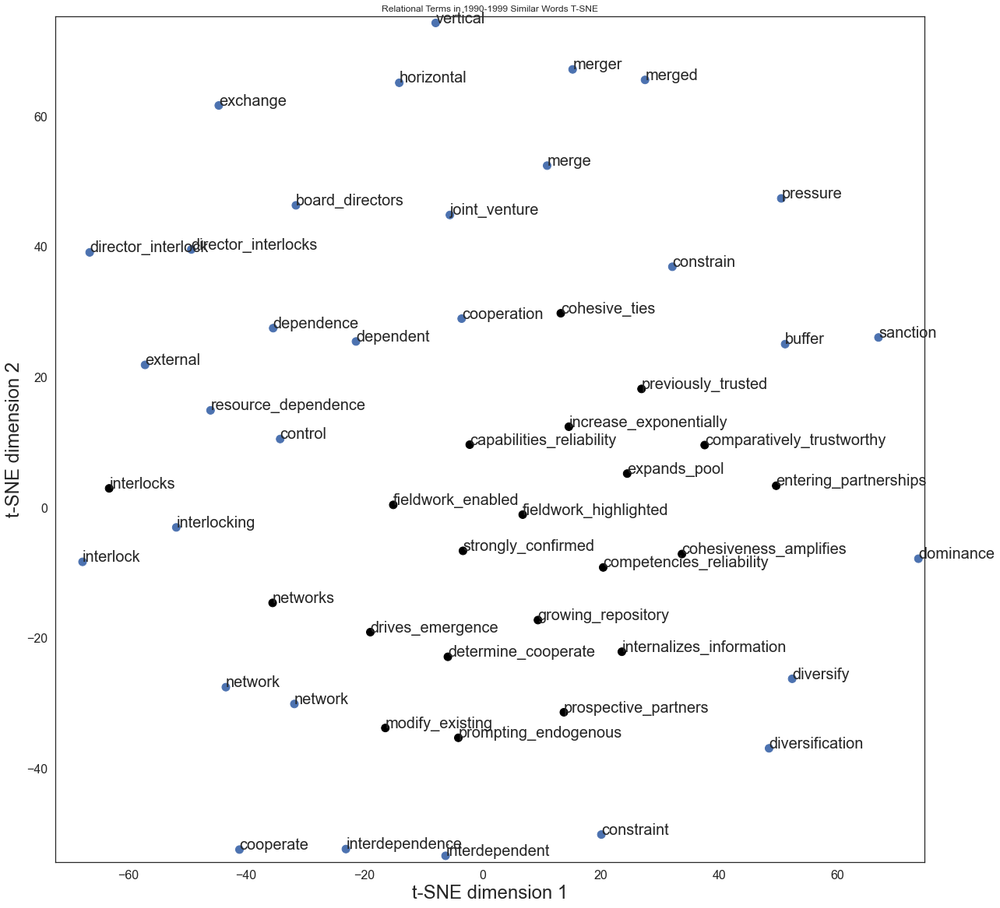

Cultural Terms in 2000-2015 Similar Words Dendrogram


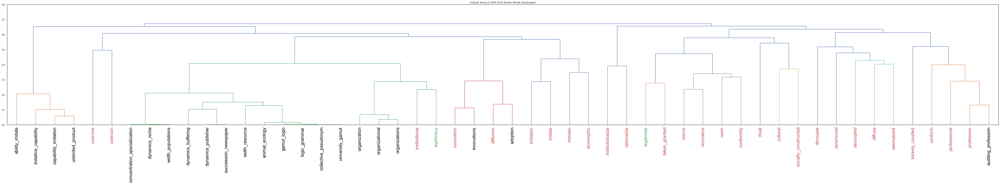


Cultural Terms in 2000-2015 Similar Words T-SNE


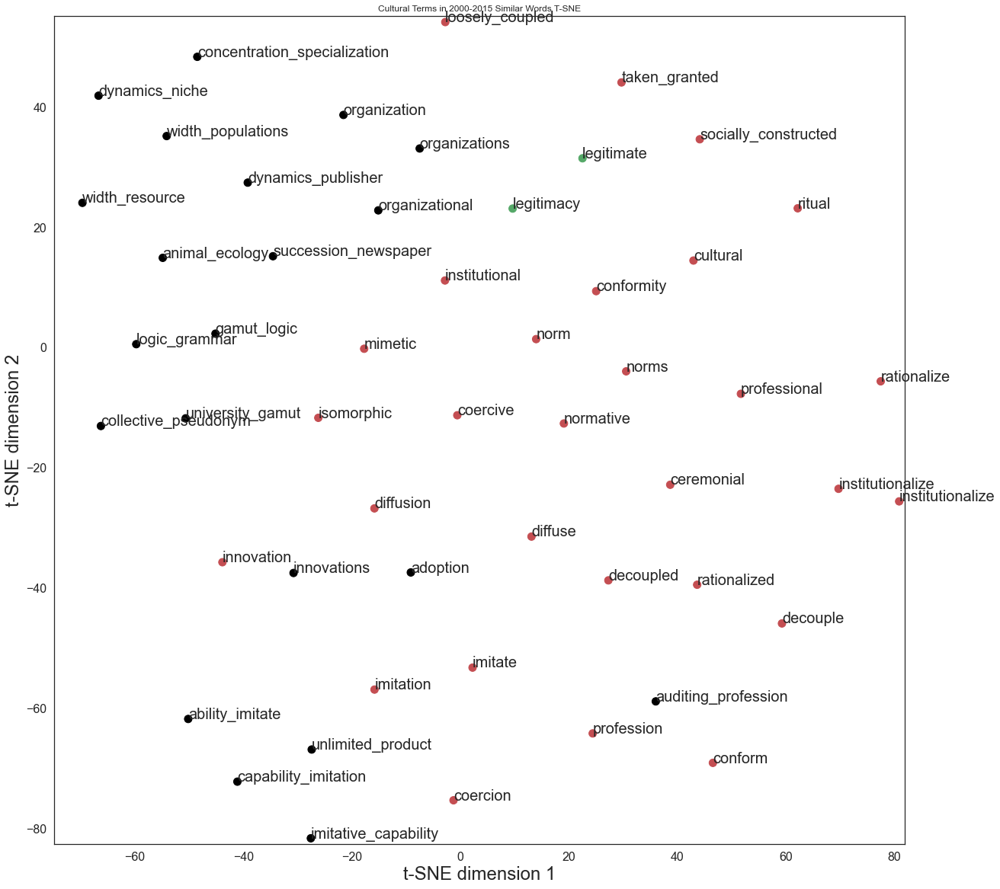

Demographic Terms in 2000-2015 Similar Words Dendrogram


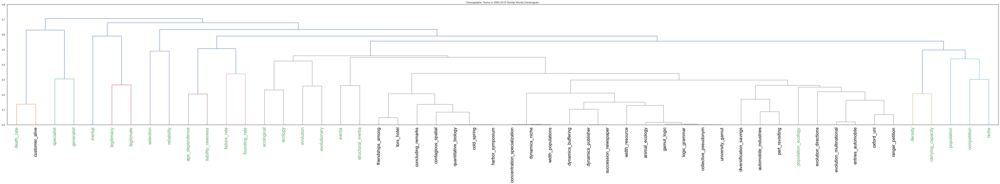


Demographic Terms in 2000-2015 Similar Words T-SNE


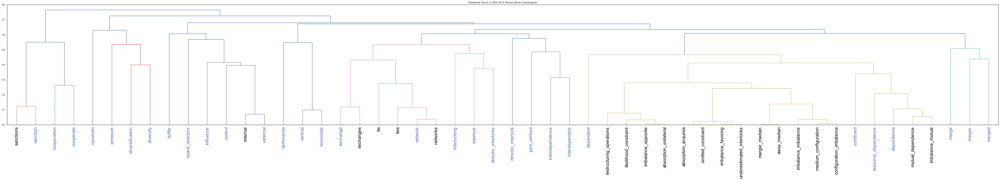


Relational Terms in 2000-2015 Similar Words T-SNE


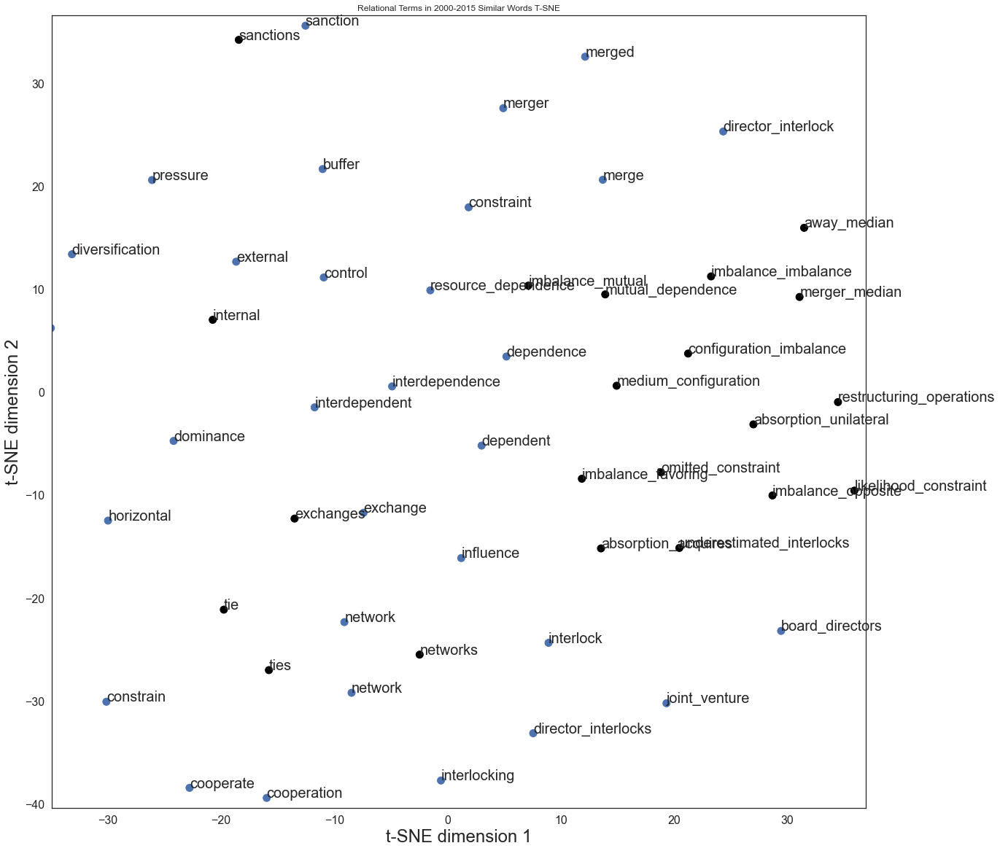

In [27]:
# Single Linkage
for model, decade in zip(models, decades):
    for core, title in zip([cult_core, dem_core, relt_core], ['Cultural', 'Demographic', 'Relational']):
        seed_clusters(model, core, k=50,title=f'{title} Terms in {decade}',
#                       save=f'data/linked_words/{title}-{decade}-single.csv',
                      p=50)

In [ ]:
# Average Linkage
for model, decade in zip(models, decades):
    for core, title in zip([cult_core, dem_core, relt_core], ['Cultural', 'Demographic', 'Relational']):
        seed_clusters(model, core, k=30,title=f'{title} Terms in {decade}',
#                       save=f'data/linked_words/{title}-{decade}-average.csv', 
                      p=50, comb=np.mean)

In [ ]:
def decade_core_TSNE(model, title="Core T-SNE"):
    show_tsne(model.wv, all_core, title, color_map=all_color_map)

In [ ]:
for model, decade in zip(models, decades):
    decade_core_TSNE(model, title="Core Terms in "+decade)

## Spectral Clustering

In [73]:
import scipy.cluster.hierarchy as shc
from scipy.cluster import hierarchy

In [279]:
def plot_spectral_dendrogram_core(model, year, linkage):
    
    label_filter=lambda x: x in all_core
    vecs = []
    labels = []
    for word in model.wv.index_to_key:
        if label_filter and not label_filter(word):
            continue 
        labels.append(word)
        vecs.append(model.wv.get_vector(word))

    vecs = np.array(vecs)
    cos_dis = (1 - cosine_similarity(vecs, vecs))**3
    
    Z = hierarchy.linkage(cos_dis, linkage)
    
    plt.figure(figsize = (15,3))
    dn = hierarchy.dendrogram(Z,above_threshold_color='#bcbddc', labels=labels)

    # Assignment of colors to labels: 'a' is red, 'b' is green, etc.
    label_colors = all_color_map

    ax = plt.gca()
    xlbls = ax.get_xmajorticklabels()
    for lbl in xlbls:
        lbl.set_color(label_colors[lbl.get_text()])

    ax.tick_params(axis='x', which='major', labelsize=15)
    ax.tick_params(axis='y', which='major', labelsize=8)
    
    plt.title('dendrogram of core terms (spectral clustering) ' + year)
    plt.show()


In [280]:
years = ['1970-1979', '1980-1989','1990-1999','2000-2015']

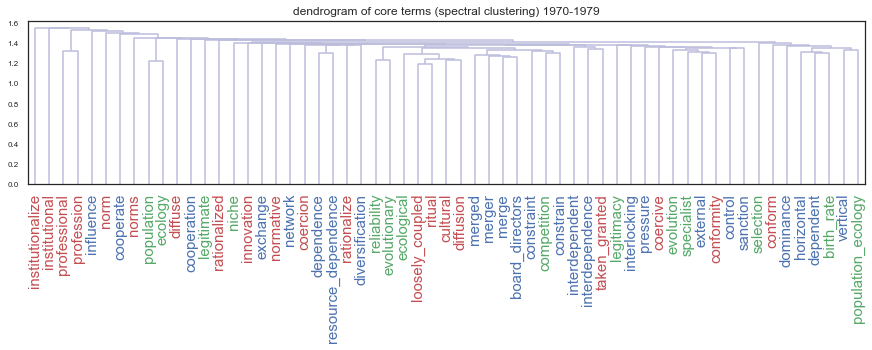

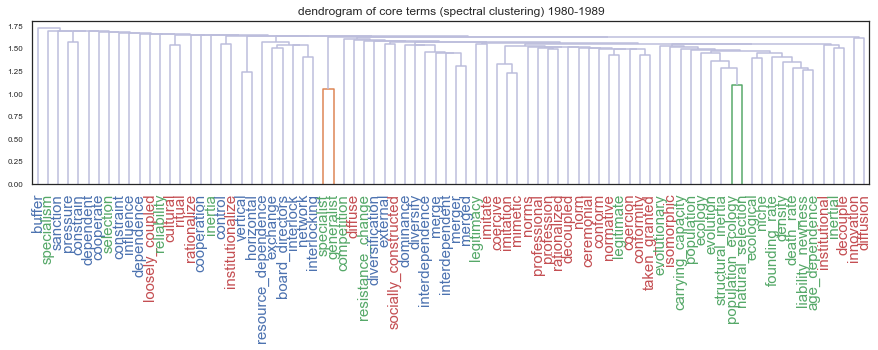

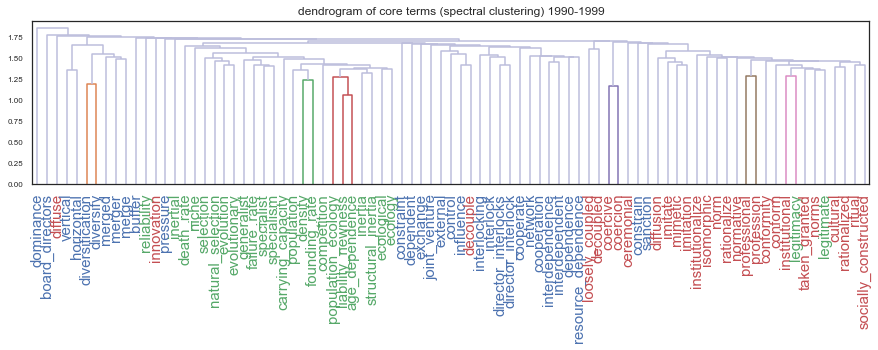

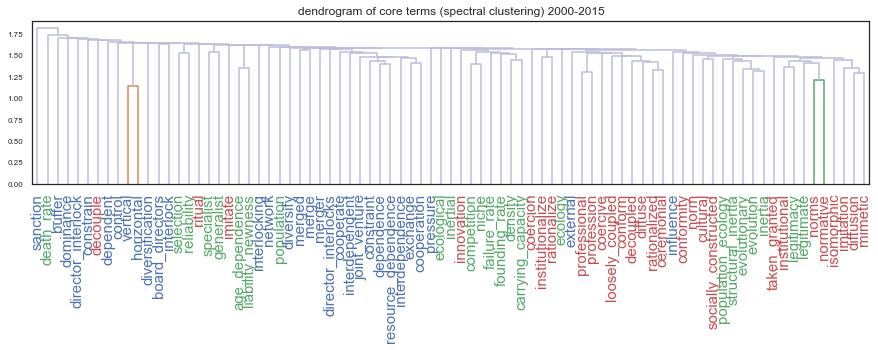

In [281]:
## single linkage
for i in np.arange(4):
    plot_spectral_dendrogram_core(models[i], years[i], 'single')

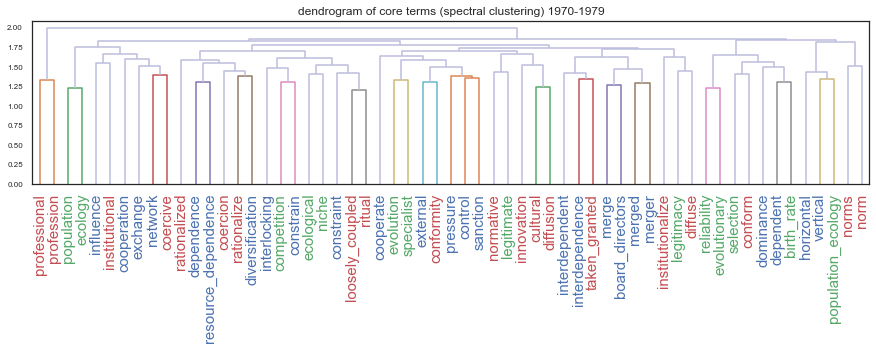

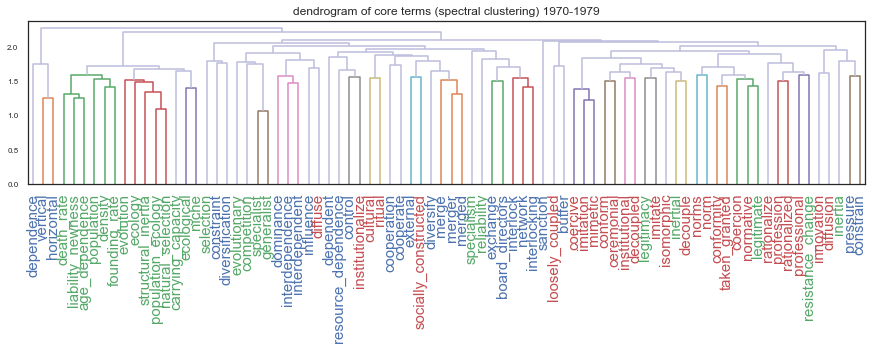

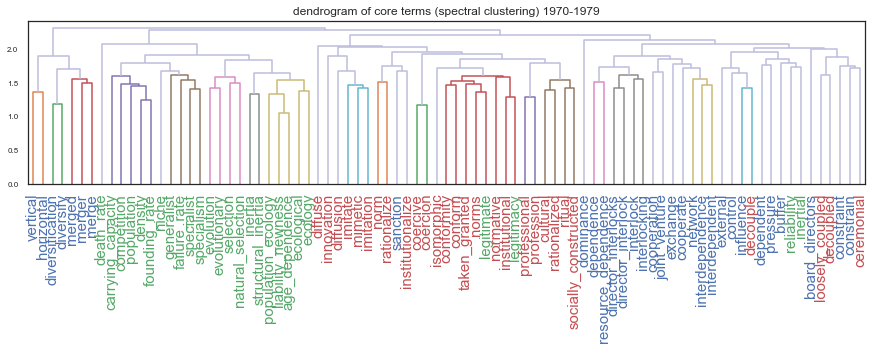

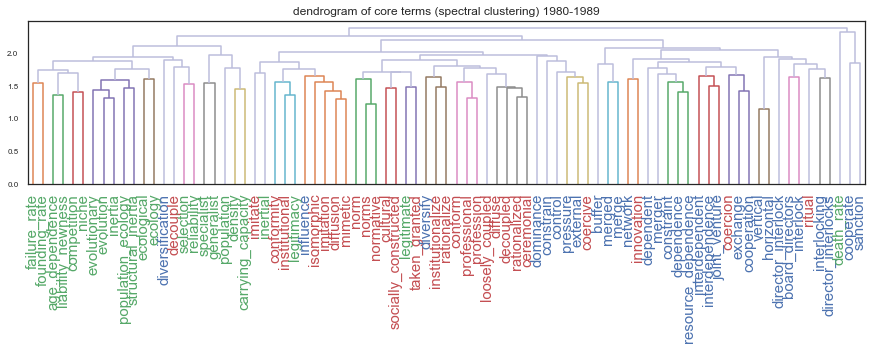

In [289]:
## average linkage
for i in np.arange(4):
    plot_spectral_dendrogram_core(models[i], years[i], 'average')

In [192]:
def remove_terms(seed_lst, m):
    for i in range(5):
        for word in seed_lst:
            try: 
                if m.wv.key_to_index[word] > 0:
#                     print('in vocab')
                    pass
            except:
                    seed_lst.remove(word)
                    # print("Removed " + str(word) + " from demog dictionary.")
        # Repeat for quality (second pass sometimes catches more):
        for word in seed_lst:
            try: 
                if m.wv.key_to_index[word] > 0:
                    pass
#                     print('in vocab')
            except:
                    seed_lst.remove(word)
                    # print("Removed " + str(word) + " from demog dictionary.")

    #     Remove surnames in culture
        # for word in seed_lst:
        #     if word in surnames:
        #         seed_lst.remove(word)
        #         print("Removed " + str(word) + " from demog dictionary.")

    # print("Length of culture dictionary filtered into vector space:", len(seed_lst))
    return seed_lst

In [259]:
cult_seed_lst1 = remove_terms(list(cult_core), models[0])
demog_seed_lst1 = remove_terms(list(dem_core), models[0])
rela_seed_lst1 = remove_terms(list(relt_core), models[0])

cult_seed_lst2 = remove_terms(list(cult_core), models[1])
demog_seed_lst2 = remove_terms(list(dem_core), models[1])
rela_seed_lst2 = remove_terms(list(relt_core), models[1])

cult_seed_lst3 = remove_terms(list(cult_core), models[2])
demog_seed_lst3 = remove_terms(list(dem_core), models[2])
rela_seed_lst3 = remove_terms(list(relt_core), models[2])

cult_seed_lst4 = remove_terms(list(cult_core), models[3])
demog_seed_lst4 = remove_terms(list(dem_core), models[3])
rela_seed_lst4 = remove_terms(list(relt_core), models[3])

In [260]:
closest_cult_30_1 = list(pd.read_csv('closest_cult_50_1970_1979.csv', header = None)[0]) + cult_seed_lst1
closest_rela_30_1 = list(pd.read_csv('closest_rela_50_1970_1979.csv', header = None)[0])+ rela_seed_lst1
closest_demog_30_1 = [k[0] for k in models[0].wv.most_similar(demog_seed_lst1,topn=50)]+ demog_seed_lst1

closest_cult_30_2 = list(pd.read_csv('closest_cult_50_1980_1989.csv', header = None)[0])+ cult_seed_lst2
closest_rela_30_2 = list(pd.read_csv('closest_rela_50_1980_1989.csv', header = None)[0])+ rela_seed_lst2
closest_demog_30_2 = [k[0] for k in models[1].wv.most_similar(demog_seed_lst2,topn=50)]+ demog_seed_lst2

closest_cult_30_3 = list(pd.read_csv('closest_cult_50_1990-1999.csv', header = None)[0]) + cult_seed_lst3
closest_rela_30_3 = list(pd.read_csv('closest_rela_50_1990-1999.csv', header = None)[0])+ rela_seed_lst3
closest_demog_30_3 = [k[0] for k in models[2].wv.most_similar(demog_seed_lst3,topn=50)]+ demog_seed_lst3

closest_cult_30_4 = list(pd.read_csv('closest_cult_50_2000_2016.csv', header = None)[0])+ cult_seed_lst4
closest_rela_30_4 = list(pd.read_csv('closest_rela_50_2000_2016.csv', header = None)[0])+ rela_seed_lst4
closest_demog_30_4 = [k[0] for k in models[3].wv.most_similar(demog_seed_lst4,topn=50)]+ demog_seed_lst4


In [292]:
def plot_spectral_dendrograms_related(model, year, term_list, category, linkage):
    vecs = []
    
    term_list_copy = term_list.copy()
    
    for word in term_list:
        try:
            vecs.append(model.wv.get_vector(word))
        except:
            print('removed!', word)
            term_list_copy.remove(word)
    
    # print(len(term_list_copy))
    # print(len(vecs))
    
    vecs = np.array(vecs)
    cos_dis = (1 - cosine_similarity(vecs, vecs))**3

    Z = hierarchy.linkage(cos_dis,linkage)

    plt.figure(figsize = (15,3))
    dn = hierarchy.dendrogram(Z,above_threshold_color='#bcbddc', labels=term_list_copy)

    # Assignment of colors to labels: 'a' is red, 'b' is green, etc.
    label_colors = all_color_map

    ax = plt.gca()
    xlbls = ax.get_xmajorticklabels()
    ax.tick_params(axis='x', which='major', labelsize=15)
    ax.tick_params(axis='y', which='major', labelsize=8)
    plt.xticks(rotation = 90)
    for lbl in xlbls:
        try:
            lbl.set_color(label_colors[lbl.get_text()])
        except:
            pass

    plt.title('dendrogram of 50 related terms (spectral clustering) '+ category+ ' ' +year  )
    plt.show()

In [293]:
all_term_lst = [closest_cult_30_1,closest_rela_30_1,closest_demog_30_1,
                closest_cult_30_2,closest_rela_30_2,closest_demog_30_2,
                closest_cult_30_3,closest_rela_30_3,closest_demog_30_3,
                closest_cult_30_4,closest_rela_30_4,closest_demog_30_4]

In [294]:
categories = ['cultural', 'relational','demographic']*4

In [295]:
years = ['1970-1979', '1970-1979', '1970-1979', 
       '1980-1989', '1980-1989', '1980-1989', 
        '1990-1999', '1990-1999', '1990-1999',
        '2000-2016', '2000-2016','2000-2016'
       
       ]

In [296]:
all_models = [models[0],models[0],models[0],
              models[1],models[1],models[1],
              models[2],models[2],models[2],
              models[3],models[3],models[3]]
              
              

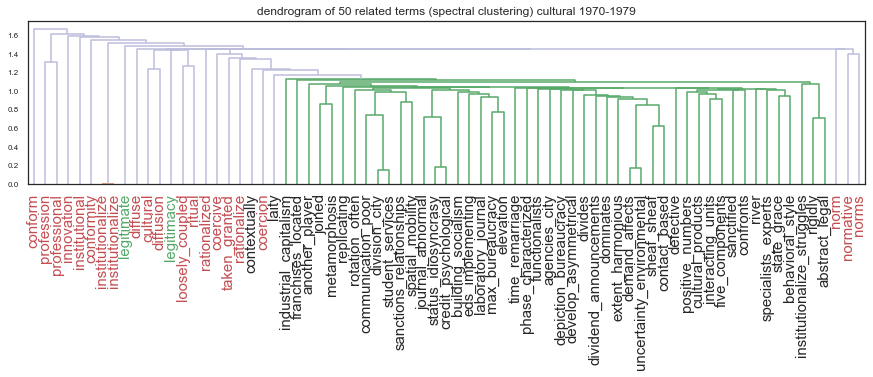

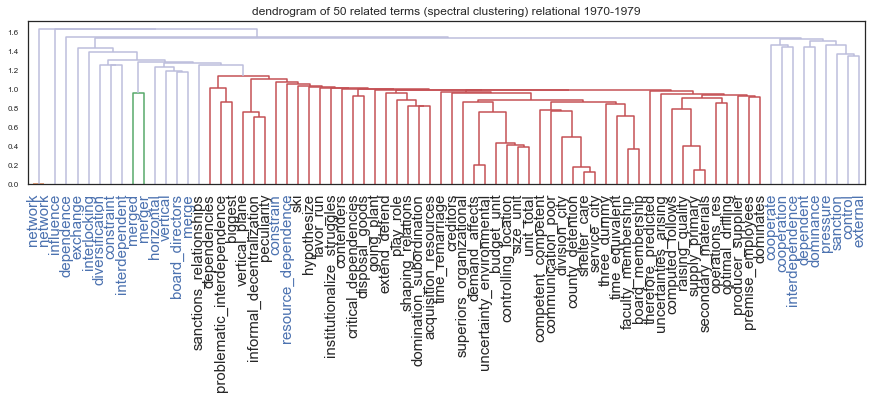

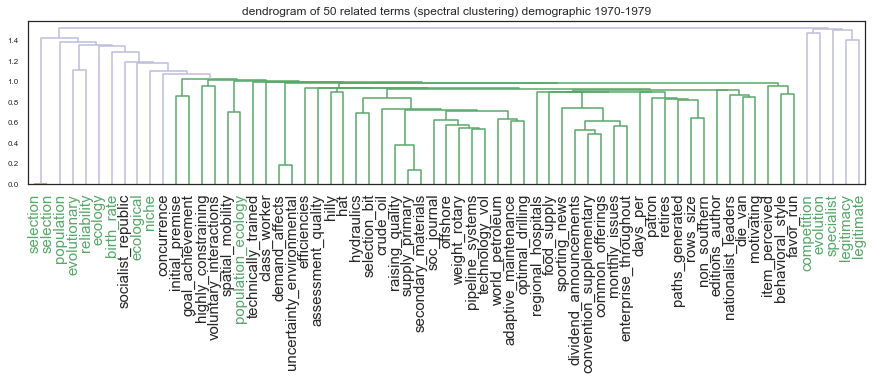

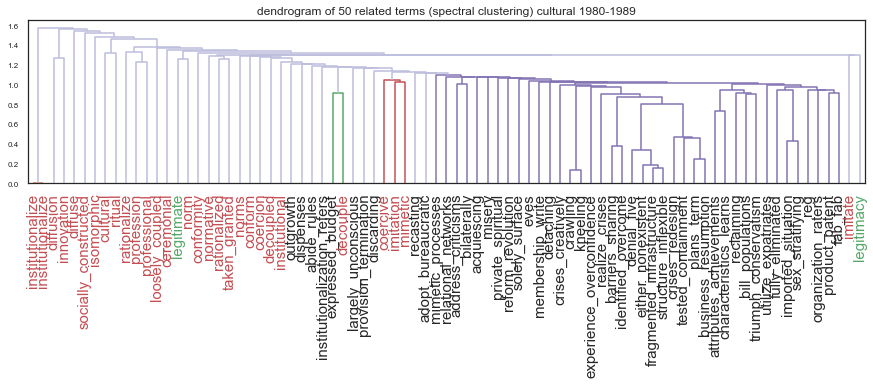

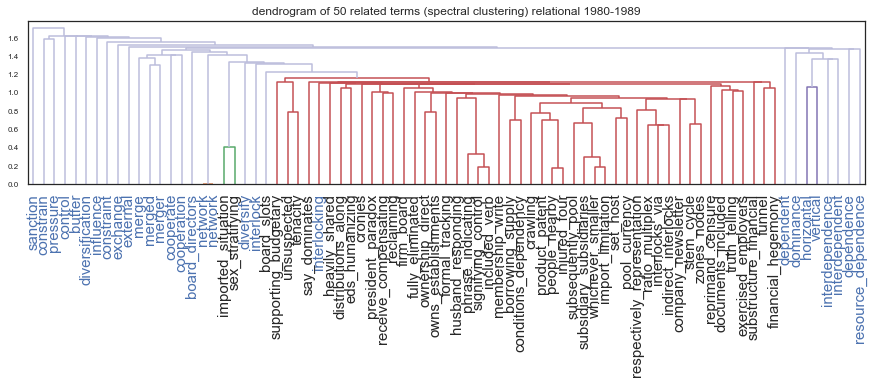

...

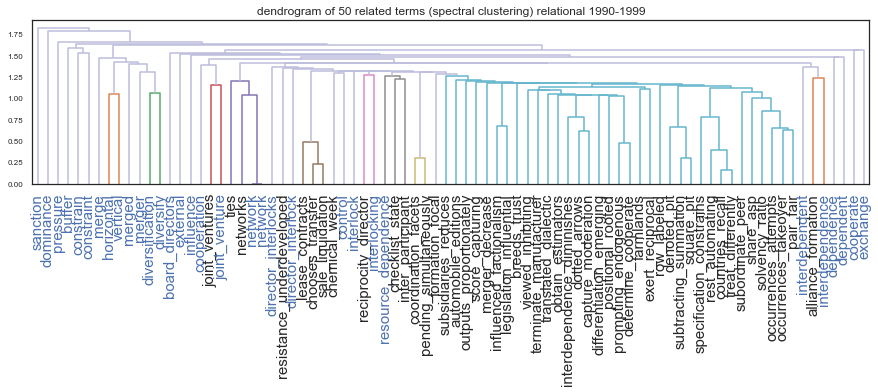

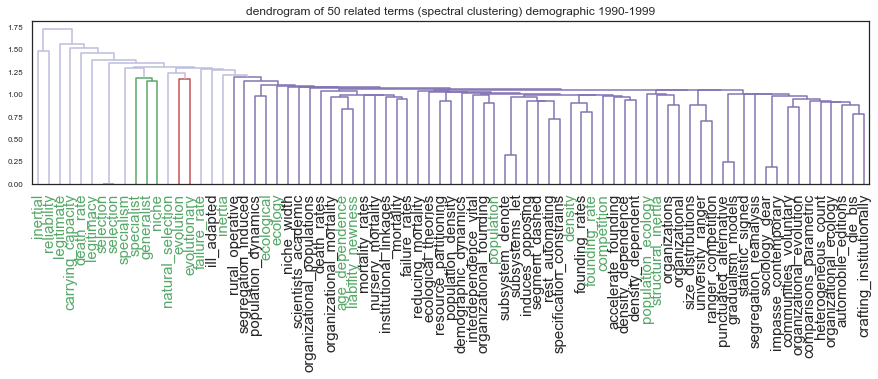

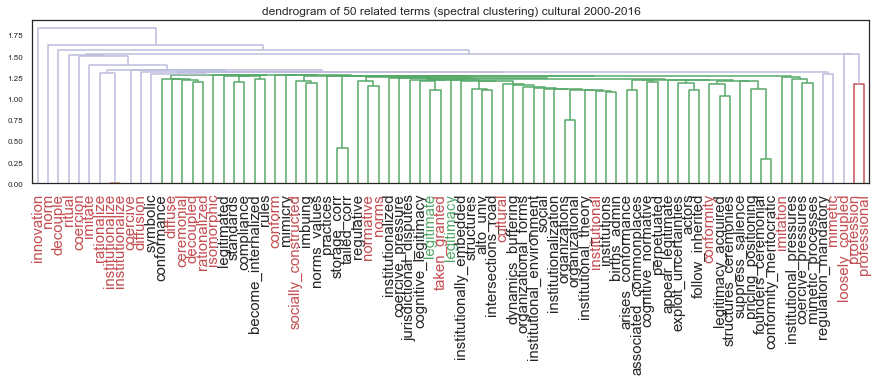

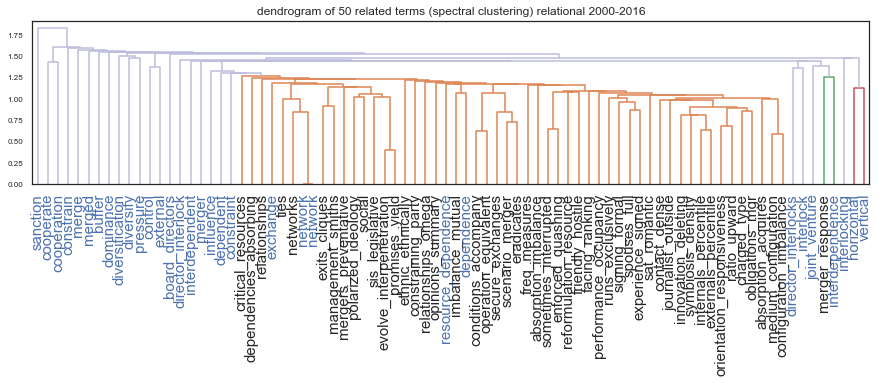

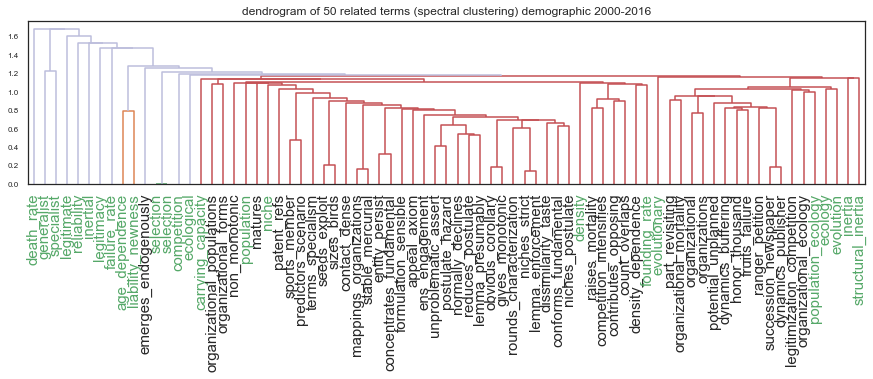

In [298]:
## single linkage
for i in np.arange(12):
    plot_spectral_dendrograms_related(all_models[i], years[i], all_term_lst[i], categories[i], 'single')